# Lab Assignment Two: Exploring Text Data

###   --------   Rongxiao Huang,  Zee Liu,  Hua Zong

## 1. Business Understanding

#### An overview of the dataset:
We are going to use a text corpus, which is a large body of text, build in nltk package.

The Brown Corpus was the first million-word electronic corpus of English, created in 1961 at Brown University. This corpus contains text from 500 sources, and the sources have been categorized by genre, such as news, editorial, and so on.
(http://www.nltk.org/book/ch02.html)

#### The purpose of the data set selected:
Find the relevant words for each genre.

#### Why is this data important?
Articles could be easily classified to different genre by just analysing the linguistic data. It is useful for data base managment. It is a convenient resource for studing systematic differences between genres.

#### How will you know if you have gathered useful knowledge from the dataset?
We can consider the statistical summary and other useful measures (e.g. tf-idf), and further analyze by doing visualization.

## 2. Data Encoding

### 2.1 Data Description

There are 500 documents in the data set. And the total number of words is 1,161,192 before data cleaning.

In [1]:
# read in brown corpus from nltk package
import nltk
# already download brown corpus
# nltk.download()
from nltk.corpus import brown

# list the names of the first ten documents
print('The names of the first ten documents in Brown Corpus:')
print(brown.fileids()[:10])

# find the number of document in brown corpus
print('--------------------------------------')
print('The number of documents in brown corpus:')
print(len(brown.fileids()))

# find the total words in brown corpus
print('--------------------------------------')
print('The number of words in brown corpus:')
print(len(brown.words()))

The names of the first ten documents in Brown Corpus:
['ca01', 'ca02', 'ca03', 'ca04', 'ca05', 'ca06', 'ca07', 'ca08', 'ca09', 'ca10']
--------------------------------------
The number of documents in brown corpus:
500
--------------------------------------
The number of words in brown corpus:
1161192


There are 15 genres. We have a relatively small sample of 'humor' and 'science_fiction'. Therefore, we should pay attention to these two genre for later data analysis.

In [2]:
# list the genre
print('The genre in Brown Corpus:')
print(brown.categories())

# find the number of genre
print('--------------------------------------')
print('The number of genre:')
print(len(brown.categories()))

# find the number of documents for each genre
print('--------------------------------------')
print('The number of documents for each genre:')
for categ in brown.categories():
    num_doc = len(brown.fileids(categories = categ))
    print(categ + ':', num_doc, end ='; ')

The genre in Brown Corpus:
['adventure', 'belles_lettres', 'editorial', 'fiction', 'government', 'hobbies', 'humor', 'learned', 'lore', 'mystery', 'news', 'religion', 'reviews', 'romance', 'science_fiction']
--------------------------------------
The number of genre:
15
--------------------------------------
The number of documents for each genre:
adventure: 29; belles_lettres: 75; editorial: 27; fiction: 29; government: 30; hobbies: 36; humor: 9; learned: 80; lore: 48; mystery: 24; news: 44; religion: 17; reviews: 17; romance: 29; science_fiction: 6; 

The following lists the number of words, sentences and vocabularies in each document.

In [3]:
# information about each text (only list the first ten)
for fileid in brown.fileids()[:10]:
    num_words = len(brown.words(fileid))
    num_sents = len(brown.sents(fileid))
    num_vocab = len(set(w.lower() for w in brown.words(fileid)))
    print('Number of words:', num_words, '  Number of sentences:', num_sents, \
          '  Number of vocabulary:', num_vocab, '  File name:', fileid)

Number of words: 2242   Number of sentences: 98   Number of vocabulary: 800   File name: ca01
Number of words: 2277   Number of sentences: 98   Number of vocabulary: 867   File name: ca02
Number of words: 2275   Number of sentences: 112   Number of vocabulary: 774   File name: ca03
Number of words: 2217   Number of sentences: 88   Number of vocabulary: 849   File name: ca04
Number of words: 2244   Number of sentences: 84   Number of vocabulary: 718   File name: ca05
Number of words: 2263   Number of sentences: 99   Number of vocabulary: 793   File name: ca06
Number of words: 2270   Number of sentences: 120   Number of vocabulary: 841   File name: ca07
Number of words: 2187   Number of sentences: 101   Number of vocabulary: 779   File name: ca08
Number of words: 2234   Number of sentences: 113   Number of vocabulary: 846   File name: ca09
Number of words: 2282   Number of sentences: 106   Number of vocabulary: 839   File name: ca10


In [4]:
# an example text
' '.join(brown.words('ca01'))

"The Fulton County Grand Jury said Friday an investigation of Atlanta's recent primary election produced `` no evidence '' that any irregularities took place . The jury further said in term-end presentments that the City Executive Committee , which had over-all charge of the election , `` deserves the praise and thanks of the City of Atlanta '' for the manner in which the election was conducted . The September-October term jury had been charged by Fulton Superior Court Judge Durwood Pye to investigate reports of possible `` irregularities '' in the hard-fought primary which was won by Mayor-nominate Ivan Allen Jr. . `` Only a relative handful of such reports was received '' , the jury said , `` considering the widespread interest in the election , the number of voters and the size of this city '' . The jury said it did find that many of Georgia's registration and election laws `` are outmoded or inadequate and often ambiguous '' . It recommended that Fulton legislators act `` to have t

### 2.2 Data Quality

The example below indicates that there are a lot of punctuations and unmeaningful words. We considered to delete them later.

In [5]:
# make the genre 'news' and example and find the conditional frequency of each vocabulary
news_text = brown.words(categories='news')
news_fdist = nltk.FreqDist(w.lower() for w in news_text)

# sort each vocabulary according to its conditional frequency
# list the top 10 popular vocabularies
import operator
sorted(news_fdist.items(), key=operator.itemgetter(1),reverse=True)[:10]

[('the', 6386),
 (',', 5188),
 ('.', 4030),
 ('of', 2861),
 ('and', 2186),
 ('to', 2144),
 ('a', 2130),
 ('in', 2020),
 ('for', 969),
 ('that', 829)]

Actually, the above words include punctuation and frequently occuring words that don't carry much meaning, which refer to 'stop words'. We also consider to remove numbers. Therefore, only alphabets remain because it is a corpus of English.

In [6]:
# import a stop word list from the Python Natural Language Toolkit (NLTK)
from nltk.corpus import stopwords 

# import a package for dealing with regular expressions
import re

In [7]:
# create a function to clean the text data
def clean_brown(raw_word_list):
    # 1. convert a brown.words(fileid) to a string of words
    str_word =' '.join(raw_word_list)
    #
    # 2. remove non-letters
    letters_only = re.sub("[^a-zA-Z]", " ", str_word)
    #
    # 3. convert to lower case
    lower_case = letters_only.lower() 
    #
    # 4. split into individual words
    words = lower_case.split()
    #
    # 5. in Python, searching a set is much faster than searching a list, so convert the stop words to a set
    stops = set(stopwords.words("english"))
    #
    # 6. remove stop words
    meaningful_words = [w for w in words if not w in stops]
    #
    # 7. Join the words back into one string separated by space, and return the result.
    return( " ".join( meaningful_words ))

In [8]:
# initialize an empty list to hold the clean texts
clean_files = []

# Loop over each file; create an index i that goes from 0 to the length of the file list 
for fileid in brown.fileids():
    # Call our function for each one, and add the result to the list of clean list
    clean_files.append(clean_brown(brown.words(fileid)))

In [9]:
# show the first few words in each document
for i in range(0, len(clean_files)):
    print(brown.fileids()[i], clean_files[i][:50], '...')

ca01 fulton county grand jury said friday investigation ...
ca02 austin texas committee approval gov price daniel a ...
ca03 several defendants summerdale police burglary tria ...
ca04 oslo positive element emerge oslo meeting north at ...
ca05 east providence organize civil defense setup begin ...
ca06 plainfield james p mitchell sen walter h jones r b ...
ca07 resentment welled yesterday among democratic distr ...
ca08 appointment william pfaff jr promotion manager tim ...
ca09 city controller alexander hemphill charged tuesday ...
ca10 vincent g ierulli appointed temporary assistant di ...
ca11 miami fla march orioles tonight retained distincti ...
ca12 austin texas texas halfback even know team plays e ...
ca13 rookie ron nischwitz continued pinpoint pitching m ...
ca14 philadelphia jan nick skorich line coach football  ...
ca15 cardinals heed manager gene mauch phillies misled  ...
ca16 romantic news concerns mrs joan monroe armour f le ...
ca17 closed seven months garden gods clu

After cleaning the data, only 534,080 words left compared to the original 1,161,192 words. (a half cut)

In [10]:
# calculate the number of words after cleaning
clean_len = len(' '.join(clean_files).split())
print('The number of words after:', clean_len)
print('----------------------------------')
print('The number of words before: 1161192')

The number of words after: 534080
----------------------------------
The number of words before: 1161192


### 2.3 Bag-of-words Representation

In [11]:
# convert the data from preprocessed raw text into a sparse encoded bag-of-words representation
from sklearn.feature_extraction.text import CountVectorizer
count_vect = CountVectorizer() 

bag_words = count_vect.fit_transform(clean_files)

In [12]:
# find the shape of the sparse matrix
print('The shape of bag of words:')
print(bag_words.shape)

The shape of bag of words:
(500, 41264)


In [13]:
# find the total vocabulary of the data
print('The total number of vocabulary of the preprocessed data:')
print(len(count_vect.vocabulary_))
print('---------------------------------')
print(count_vect.vocabulary_)

The total number of vocabulary of the preprocessed data:
41264
---------------------------------
{'randomly': 29488, 'adonis': 532, 'breathtaking': 4514, 'raoul': 29515, 'unfitting': 38644, 'transcribe': 37670, 'disproving': 10659, 'aiee': 826, 'sobbing': 33954, 'cennino': 5877, 'encroaching': 12114, 'nauseated': 24328, 'naive': 24218, 'reynolds': 30938, 'hardship': 16597, 'affaire': 649, 'respectability': 30674, 'pornographer': 27868, 'scudding': 32308, 'nairobi': 24217, 'glycerin': 15626, 'indorsed': 18561, 'insecticides': 18870, 'soothe': 34155, 'breeches': 4518, 'torquers': 37477, 'scrutiny': 32307, 'paralysis': 26245, 'outlaws': 25735, 'granulocytic': 15883, 'cio': 6482, 'harding': 16591, 'dragnet': 11124, 'goin': 15686, 'jeremiah': 19731, 'wedge': 40239, 'zing': 41226, 'statesmanlike': 34873, 'protruded': 28794, 'computes': 7459, 'departures': 9762, 'microscope': 23134, 'colossus': 7101, 'hump': 17732, 'capability': 5415, 'plainly': 27426, 'enhanced': 12224, 'banion': 2833, 'remo

In [14]:
# make the first document an example to find its vocabulary
print(bag_words[0])

# look at the data using an inverse transform
print('------------------------------------------')
print(count_vect.inverse_transform(bag_words[0]))

  (0, 14858)	14
  (0, 8420)	15
  (0, 15855)	4
  (0, 19990)	18
  (0, 31689)	24
  (0, 14726)	4
  (0, 19338)	1
  (0, 2295)	7
  (0, 29786)	1
  (0, 28394)	4
  (0, 11789)	14
  (0, 28517)	1
  (0, 12752)	1
  (0, 19460)	3
  (0, 37415)	2
  (0, 27408)	4
  (0, 36713)	4
  (0, 12123)	2
  (0, 28281)	1
  (0, 6536)	9
  (0, 12894)	2
  (0, 7238)	3
  (0, 6080)	2
  (0, 9886)	1
  (0, 28064)	1
  :	:
  (0, 5241)	1
  (0, 33104)	1
  (0, 9291)	1
  (0, 22305)	1
  (0, 9244)	1
  (0, 27944)	1
  (0, 10661)	1
  (0, 30491)	1
  (0, 36589)	1
  (0, 35487)	1
  (0, 34152)	1
  (0, 32080)	1
  (0, 21488)	1
  (0, 13518)	1
  (0, 5612)	1
  (0, 16262)	1
  (0, 28629)	1
  (0, 32963)	2
  (0, 36228)	1
  (0, 15712)	1
  (0, 28628)	1
  (0, 12749)	1
  (0, 40320)	1
  (0, 29674)	1
  (0, 33833)	1
------------------------------------------
[array(['fulton', 'county', 'grand', 'jury', 'said', 'friday',
       'investigation', 'atlanta', 'recent', 'primary', 'election',
       'produced', 'evidence', 'irregularities', 'took', 'place', 'term',
 

In [15]:
# create a data frame of the sparse matrix
import pandas as pd

pd.options.display.max_columns = 999
df = pd.DataFrame(data=bag_words.toarray(),columns=count_vect.get_feature_names())

# dispay the the first ten rows of the data frame
df.iloc[:10]

,aa,aaa,aaawww,aab,aah,aaron,ab,aback,abandon,abandoned,abandoning,abandonment,abaringe,abasement,abated,abatuno,abbas,abbe,abberations,abbey,abbot,abbott,abbreviated,abbreviation,abbreviations,abc,abdallah,abdomen,abdominal,abdominis,abduction,abe,abed,abel,abell,abelson,aber,abernathy,abernathys,aberrant,aberration,aberrations,abetted,abeyance,abhorred,abhorrent,abide,abides,abiding,abigail,abilene,abilities,ability,abject,abjection,abjectly,ablard,ablated,ablation,ablaze,able,abler,ably,abner,abnormal,abnormalities,abnormally,abo,aboard,abode,abolish,abolished,abolition,abolitionist,abolitionists,aboriginal,aborigine,aborigines,abortion,abortions,abortive,abound,abounded,abounding,abounds,aboutiveness,aboveground,abra,abraham,abrams,abrasion,abreaction,abreast,abridged,abridgment,abroad,abroade,abrogated,abrupt,abruptly,abruptness,abscesses,abscissa,absence,absences,absent,absented,absentee,absenteeism,absentia,absently,absentmindedly,absinthe,absolute,absolutely,absoluteness,absolutes,absolution,absorb,absorbed,absorbency,absorbent,absorber,absorbing,absorbs,absorption,absorptions,absorptive,abstain,abstaining,abstention,abstinence,abstract,abstracted,abstractedness,abstracting,abstraction,abstractionism,abstractionists,abstractions,abstractive,abstractly,abstractors,abstracts,abstrusenesses,absurd,absurdities,absurdity,absurdly,abundance,abundant,abundantly,abuse,abused,abuses,abusive,abutments,abysmal,abyss,abyssinians,acacia,academeh,academic,academically,academicianship,academics,academies,academy,acadia,acala,acapulco,accacia,accademia,accardo,accede,acceded,accelerate,accelerated,accelerating,acceleration,accelerations,accelerator,accelerators,accelerometer,accelerometers,accent,accented,accenting,accents,accentual,accentuate,accentuated,accentuates,accept,acceptability,acceptable,acceptance,accepted,accepting,accepts,access,accesses,accessibility,accessible,accessions,accessories,accessory,accident,accidental,accidentally,accidents,acclaim,acclaimed,acclaims,acclamation,acclimatized,accolade,accolades,accommodate,accommodated,accommodates,accommodating,accommodation,accommodations,accomodations,accompanied,accompanies,accompaniment,accompaniments,accompanist,accompanists,accompany,accompanying,accomplice,accomplices,accomplish,accomplished,accomplishes,accomplishing,accomplishment,accomplishments,accord,accordance,accorded,according,accordingly,accordion,accords,accosted,accosting,account,accountability,accountable,accountant,accountants,accounted,accounting,accounts,accouterments,accreditation,accredited,accretion,accretions,accrued,accrues,accruing,acculturated,acculturation,accumulate,accumulated,accumulates,accumulating,accumulation,accuracy,accurate,accurately,accusation,accusations,accuse,accused,accuses,accusing,accusingly,accustomed,ace,aces,acetate,acetone,acetonemia,acey,achaeans,ache,ached,aches,acheson,achieve,achieved,achievement,achievements,achievers,achieves,achieving,achilles,aching,acid,acidity,acids,acidulous,ackerly,acknowledge,acknowledged,acknowledgement,acknowledges,acknowledging,acknowledgment,acknowledgments,acolyte,aconte,acorns,acourse,acoustic,acoustical,acoustically,acoustics,acquaint,acquaintance,acquainted,acquiesce,acquiesced,acquiescence,acquiesence,acquire,acquired,acquires,acquiring,acquisition,acquisitions,acquisitiveness,acquittal,acquitted,acre,acreage,acres,acrid,acrobacy,acrobatic,acrobatics,acrobats,acropolis,across,acrylic,acs,act,acted,acth,acting,actinometer,action,actions,activate,activated,activating,activation,active,actively,actives,activism,activite,activities,activity,actor,actors,actress,actresses,acts,actual,actualities,actuality,actually,actuarial,actuarially,actuate,actuated,acumen,acute,acutely,ad,ada,adage,adagio,adagios,adair,adam,adamant,adamantly,adame,adamo,adams,adamson,adapt,adaptable,adaptaplex,adaptation,adaptations,adapted,adapter,adapters,adapting,adaptive,adc,adcock,add,addabbo,added,addict,addicted,addiction,addicts,adding,addison,addition,additiona

In [16]:
# print out 10 most common words in our data
df.sum().sort_values()[-10:]

man      1364
first    1389
may      1402
two      1516
could    1602
new      1646
time     1695
said     1961
would    2719
one      3504
dtype: int64

We go back to data cleaning based on the unsatisfying result in section 3 -- 'find the relevant words in each class'.
A set of words which are considered not meaningful were deleted.

In [17]:
# go back to clean data
# delete [may, two, could, said, would, one]
# actually these words affect the result in section 3
# decide to remove after having section 3 done
# create a function to clean the text data
def clean_continue(text):
    # 1. split into individual words
    words = text.split()
    #
    # 2. create a list including words to be removed
    removed = set(['may','two','could','said','would','one',\
                  'man','like','time','mr','year'])
    #
    # 3. remove stop words
    meaningful_words = [w for w in words if not w in removed]
    #
    # 4. Join the words back into one string separated by space, and return the result.
    return( " ".join( meaningful_words ))

In [18]:
# initialize an empty list to hold the clean texts
clean_con = []

# Loop over each file; create an index i that goes from 0 to the length of the file list 
for text in clean_files:
    # Call our function for each one, and add the result to the list of clean list
    clean_con.append(clean_continue(text))

In [19]:
# update clean_files
clean_files = clean_con

In [20]:
# update bag of words
bag_words = count_vect.fit_transform(clean_files)

# find the shape of the sparse matrix
print('The shape of bag of words:')
print(bag_words.shape)

# update the sparse matrix
pd.options.display.max_columns = 999
df = pd.DataFrame(data=bag_words.toarray(),columns=count_vect.get_feature_names())

# print out 10 most common words in our data
df.sum().sort_values()[-10:]

The shape of bag of words:
(500, 41253)


back      976
af       1005
well     1006
must     1015
many     1037
also     1069
made     1147
even     1173
first    1389
new      1646
dtype: int64

### 2.4 TF-IDF Representation

In [21]:
# convert the data into tf-idf version
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_vect = TfidfVectorizer()

tfidf_mat = tfidf_vect.fit_transform(clean_files)

In [22]:
# convert to pandas to get better idea about the data
df_tfidf = pd.DataFrame(data=tfidf_mat.toarray(),columns=tfidf_vect.get_feature_names())

# display the first ten rows
df_tfidf.iloc[:10]

aa  aaa  aaawww  aab  aah  aaron   ab  aback  abandon  abandoned  \
0  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.000000   
1  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.017117   
2  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.000000   
3  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.000000   
4  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.000000   
5  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.000000   
6  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.000000   
7  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.000000   
8  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.000000   
9  0.0  0.0     0.0  0.0  0.0    0.0  0.0    0.0      0.0   0.000000   

   abandoning  abandonment  abaringe  abasement  abated   abatuno  abbas  \
0         0.0          0.0       0.0        0.0     0.0  0.000000    0.0   
1         0.0          0.0       0.0        0.0     0.0  0.000000    0.0   
2         0.0          0.0       0.0        0.0     0.0  0.000000    0.0   
3         0.0          0.0       0.0        0.0     0.0  0.000000    0.0   
4         0.0          0.0       0.0        0.0     0.0  0.031661    0.0   
5         0.0          0.0       0.0        0.0     0.0  0.000000    0.0   
6         0.0          0.0       0.0        0.0     0.0  0.000000    0.0   
7         0.0          0.0       0.0        0.0     0.0  0.000000    0.0   
8         0.0          0.0       0.0        0.0     0.0  0.000000    0.0   
9         0.0          0.0       0.0        0.0     0.0  0.000000    0.0   

   abbe  abberations  abbey  abbot  abbott  abbreviated  abbreviation  \
0   0.0          0.0    0.0    0.0     0.0          0.0           0.0   
1   0.0          0.0    0.0    0.0     0.0          0.0           0.0   
2   0.0          0.0    0.0    0.0     0.0          0.0           0.0   
3   0.0          0.0    0.0    0.0     0.0          0.0           0.0   
4   0.0          0.0    0.0    0.0     0.0          0.0           0.0   
5   0.0          0.0    0.0    0.0     0.0          0.0           0.0   
6   0.0          0.0    0.0    0.0     0.0          0.0           0.0   
7   0.0          0.0    0.0    0.0     0.0          0.0           0.0   
8   0.0          0.0    0.0    0.0     0.0          0.0           0.0   
9   0.0          0.0    0.0    0.0     0.0          0.0           0.0   

   abbreviations  abc  abdallah  abdomen  abdominal  abdominis  abduction  \
0            0.0  0.0       0.0      0.0        0.0        0.0        0.0   
1            0.0  0.0       0.0      0.0        0.0        0.0        0.0   
2            0.0  0.0       0.0      0.0        0.0        0.0        0.0   
3            0.0  0.0       0.0      0.0        0.0        0.0        0.0   
4            0.0  0.0       0.0      0.0        0.0        0.0        0.0   
5            0.0  0.0       0.0      0.0        0.0        0.0        0.0   
6            0.0  0.0       0.0      0.0        0.0        0.0        0.0   
7            0.0  0.0       0.0      0.0        0.0        0.0        0.0   
8            0.0  0.0       0.0      0.0        0.0        0.0        0.0   
9            0.0  0.0       0.0      0.0        0.0        0.0        0.0   

        abe  abed  abel  abell  abelson  aber  abernathy  abernathys  \
0  0.000000   0.0   0.0    0.0      0.0   0.0        0.0         0.0   
1  0.000000   0.0   0.0    0.0      0.0   0.0        0.0         0.0   
2  0.000000   0.0   0.0    0.0      0.0   0.0        0.0         0.0   
3  0.000000   0.0   0.0    0.0      0.0   0.0        0.0         0.0   
4  0.000000   0.0   0.0    0.0      0.0   0.0        0.0         0.0   
5  0.000000   0.0   0.0    0.0      0.0   0.0        0.0         0.0   
6  0.030632   0.0   0.0    0.0      0.0   0.0        0.0         0.0   
7  0.000000   0.0   0.0    0.0      0.0   0.0        0.0         0.0   
8  0.000000   0.0   0.0    0.0      0.0   0.0        0.0         0.0   
9 

In [23]:
# print out 10 words with max tfidf, normalized by document occurrence
df_tfidf.max().sort_values()[-10:]

banion     0.766508
mrs        0.787191
anode      0.788623
helva      0.792449
pool       0.802399
scotty     0.807117
gorton     0.809698
hanover    0.812036
af         0.820623
hearst     0.873050
dtype: float64

## 3. Data Visualization

The plots in this section were generated based on the preprocessed data, which is 'clean_files'.

### 3.1 Statistical Summary Visualization

In [24]:
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore', DeprecationWarning)
%matplotlib inline

#### 3.1.1 Bar Plot for Document Length

In [25]:
# document length (the number of words) visualization
# plot against each document
# split each string in the list of clean_files into words
word_clean = [text.split() for text in clean_files]

# calculate the number of words in each text
word_num = [len(split_text) for split_text in word_clean]

# list the document length of the first ten texts
word_num[:10]

[1099, 1155, 1105, 1082, 1026, 1060, 1113, 1034, 1097, 1089]

In [26]:
# create a data frame to hold the word_num info
df_clean = pd.DataFrame()

# append word_num to the data frame
df_clean['document_length'] = word_num

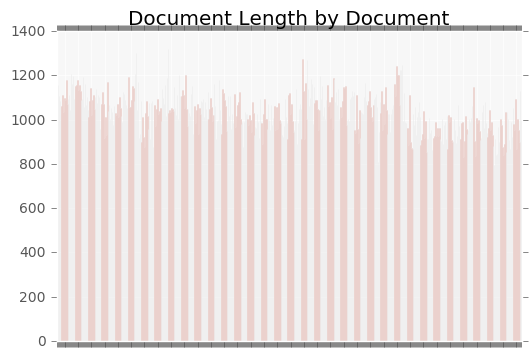

In [27]:
# plot bar chart for document length
plt.style.use('ggplot')
ax = df_clean['document_length'].plot(kind='bar')
# turn off the tick labels for index
ax.set_xticklabels([])
plt.title('Document Length by Document')
plt.show()

From the graph above, we can see that most documents have a length around 1000.

In [28]:
# summary for document length
print (df_clean.describe())

       document_length
count       500.000000
mean       1030.588000
std          87.712994
min         795.000000
25%         973.750000
50%        1029.500000
75%        1089.250000
max        1318.000000


In [29]:
# append a column of genre to the data frame
df_clean['genre'] = [brown.categories(file).pop()\
                     for file in brown.fileids()]

In [30]:
# group by genre
df_grouped = df_clean.groupby(by=['genre'])
print(df_grouped.describe())

                       document_length
genre                                 
adventure       count        29.000000
                mean        971.000000
                std          71.241040
                min         833.000000
                25%         919.000000
                50%         983.000000
                75%        1006.000000
                max        1145.000000
belles_lettres  count        75.000000
                mean       1006.786667
                std          59.874259
                min         876.000000
                25%         968.500000
                50%         998.000000
                75%        1054.500000
                max        1136.000000
editorial       count        27.000000
                mean       1038.592593
                std          57.630293
                min         915.000000
                25%        1011.000000
                50%        1040.000000
                75%        1069.500000
                max      

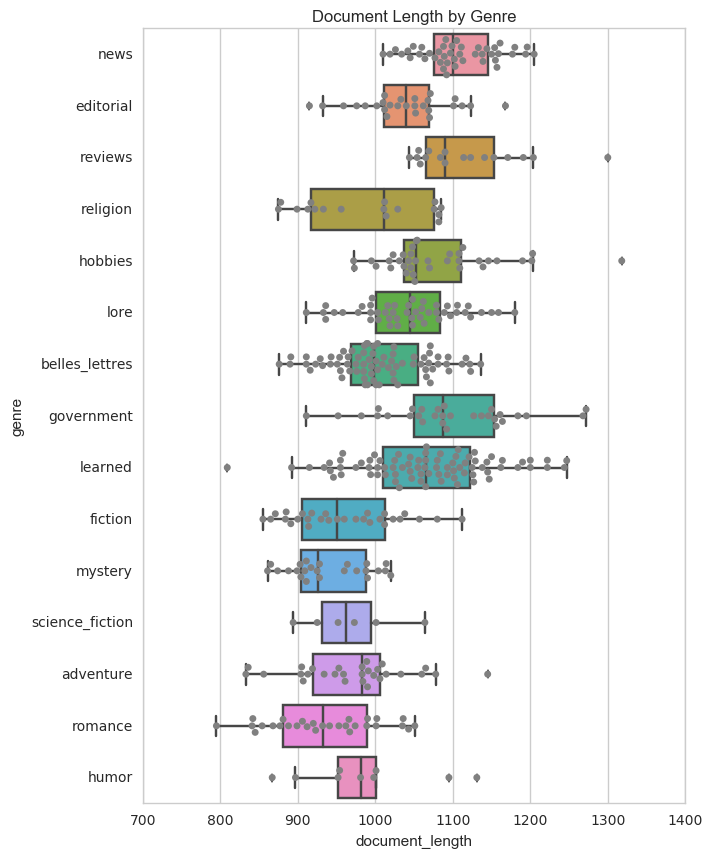

In [31]:
import seaborn as sns
sns.set_style("whitegrid")

plt.figure(figsize=(7,10))
ax = sns.boxplot(y='genre', x='document_length', data=df_clean)
ax = sns.swarmplot(y='genre', x='document_length', data=df_clean,\
                  color = 'gray')
plt.title('Document Length by Genre')
plt.show()

#### 3.1.2 Bar Plot for Vocabulary Size

In [32]:
# calculate the number of vocabulary of each document
voc_num = [len(set(text)) for text in word_clean]

# append word_num to the data frame
df_clean['vocaluary_num'] = voc_num

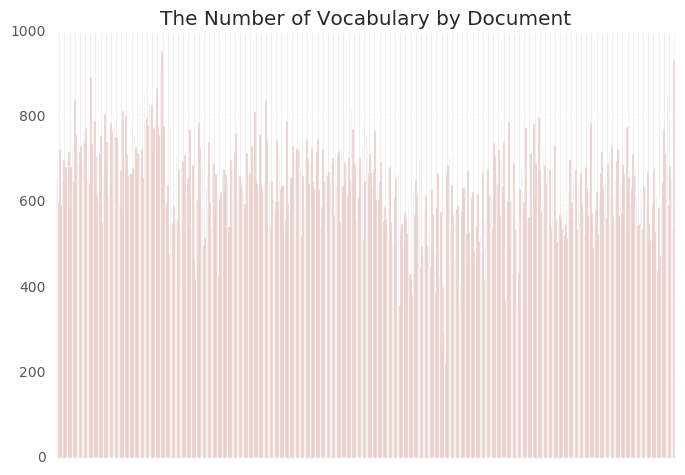

In [33]:
# plot bar chart for vocaluary_num
plt.style.use('ggplot')
ax = df_clean['vocaluary_num'].plot(kind='bar')
# turn off the tick labels for index
ax.set_xticklabels([])
plt.title('The Number of Vocabulary by Document')
plt.show()

note: number vary more dramastically compared to document length

In [34]:
# summary for vocaluary_num
print (df_clean['vocaluary_num'].describe())

count    500.000000
mean     636.510000
std      102.653736
min      224.000000
25%      574.000000
50%      644.000000
75%      702.250000
max      954.000000
Name: vocaluary_num, dtype: float64


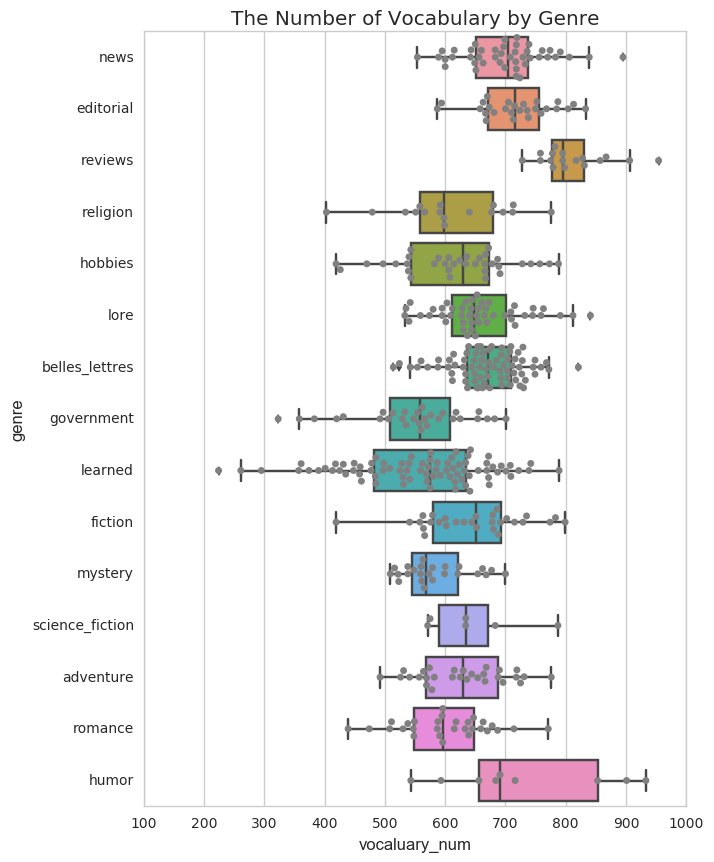

In [35]:
# plot vocaluary_num by genre
import seaborn as sns
sns.set_style("whitegrid")

plt.figure(figsize=(7,10))
ax = sns.boxplot(y='genre', x='vocaluary_num', data=df_clean)
ax = sns.swarmplot(y='genre', x='vocaluary_num', data=df_clean,\
                  color = 'gray')
plt.title('The Number of Vocabulary by Genre')
plt.show()

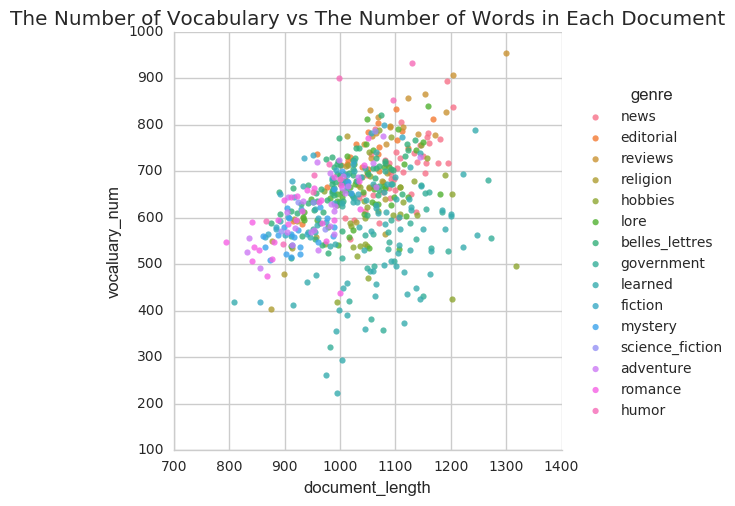

In [36]:
#1
import matplotlib.pyplot as plt
import pylab
import seaborn as sns
sns.lmplot('document_length', 'vocaluary_num', data=df_clean, hue='genre', fit_reg=False)
plt.title('The Number of Vocabulary vs The Number of Words in Each Document')
plt.show()

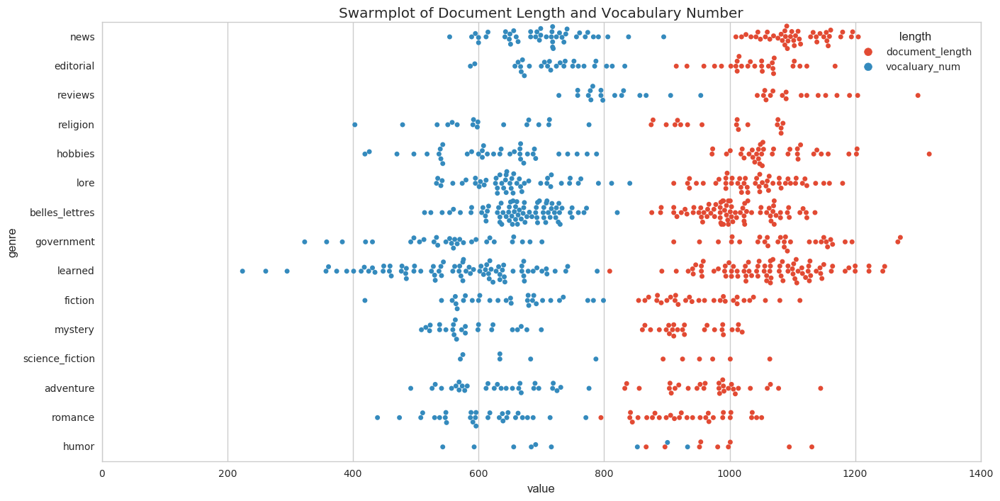

In [37]:
#2 revised, but not sure whether the x-axis could be more clear in larger screen
df_c = pd.melt(df_clean, "genre", var_name="length")
plt.figure(figsize=(16,8))
sns.swarmplot('value', 'genre', data=df_c, hue='length')
plt.title('Swarmplot of Document Length and Vocabulary Number')
plt.show()

#### 3.1.3 Word Frequency Visualization

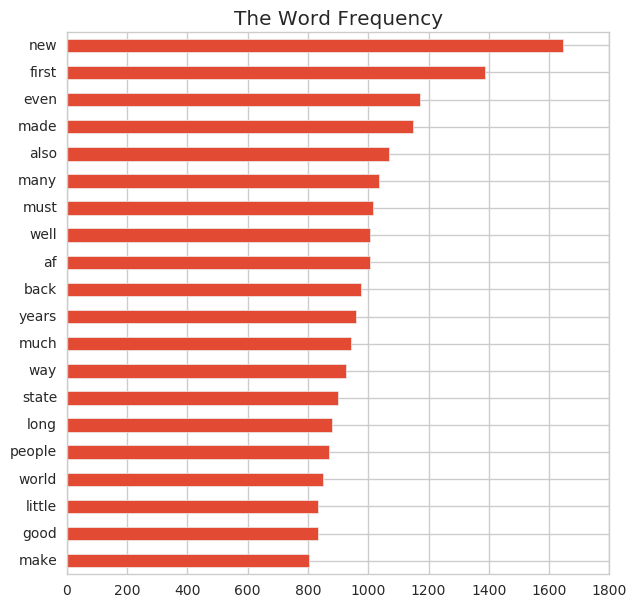

In [38]:
# calculate the word frequency of each vocabulary
voc_word = df.sum()

# visualize the 20 most common vocabulary
plt.figure(figsize=(7,7))
ax = voc_word.sort_values()[-20:].plot(kind='barh')
plt.title('The Word Frequency')
plt.show()

#### 3.1.4 TF-IDF Visualization

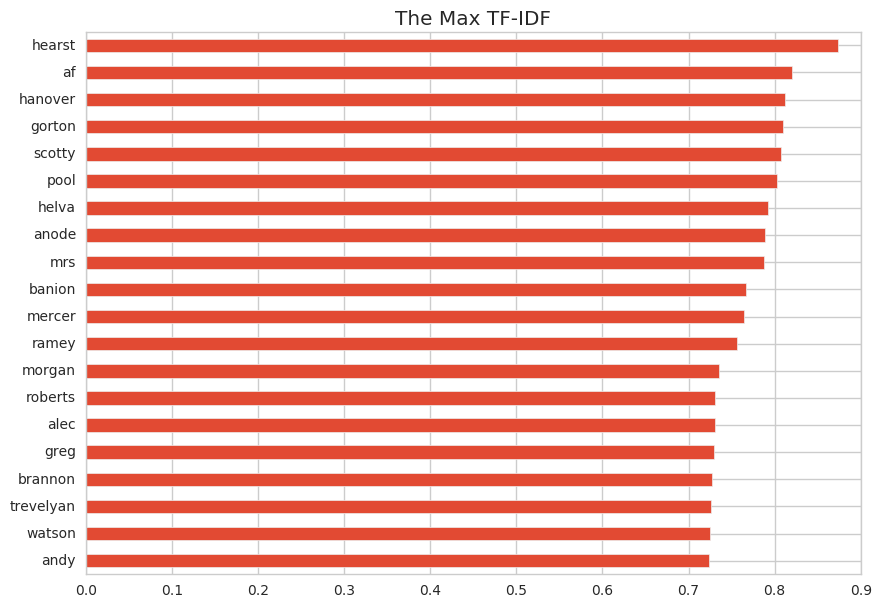

In [39]:
# tf-idf visualizaion
tfidf_max = df_tfidf.max()

# visualize the 20 words with max tfidf
plt.figure(figsize=(10,7))
ax = tfidf_max.sort_values()[-20:].plot(kind='barh')
plt.title('The Max TF-IDF')
plt.show()

### 3.2 Data Relationship Visualization

#### 3.2.1 conditional frequency of the vocabulary by genre

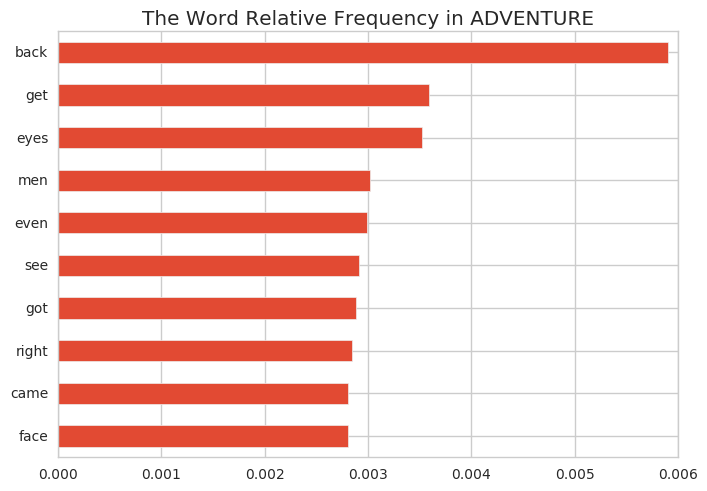

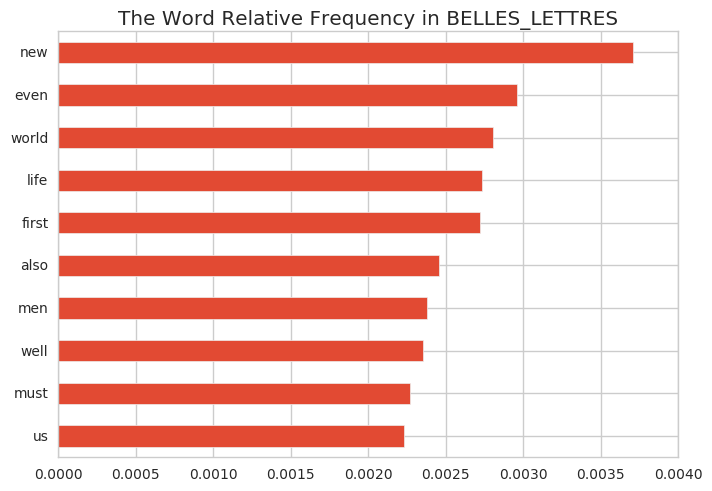

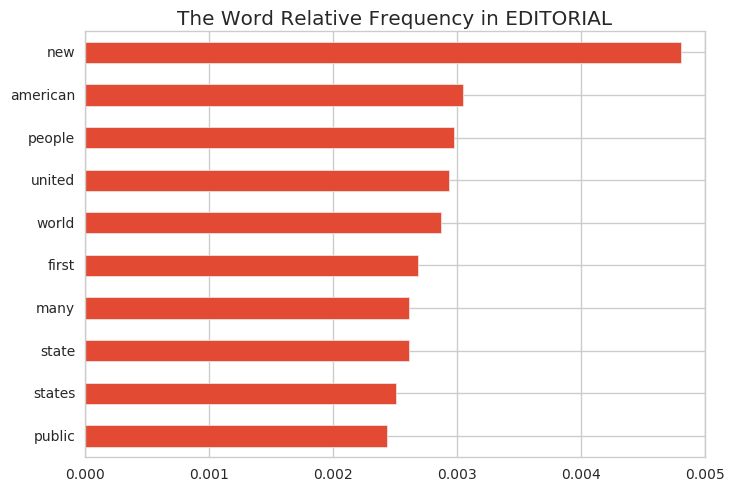

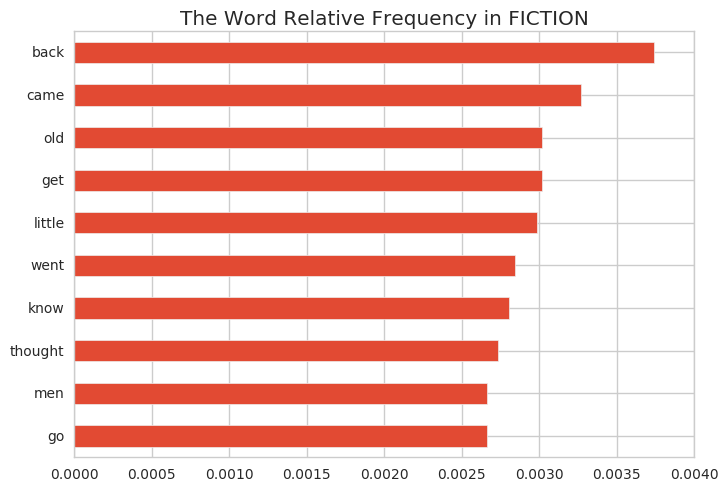

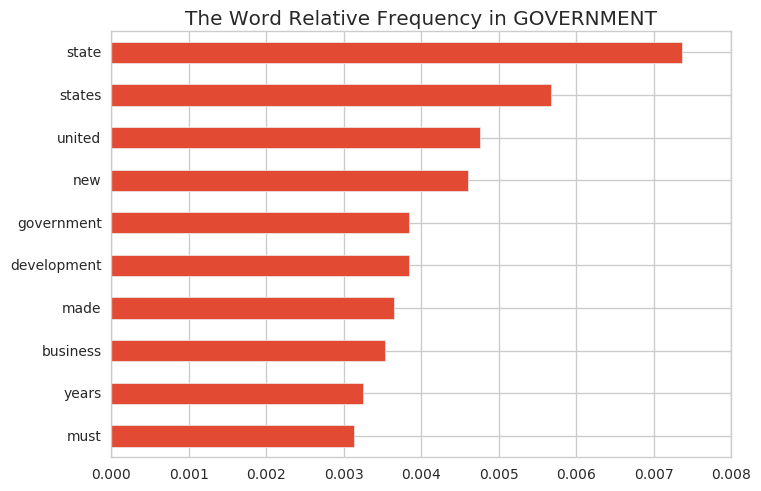

...

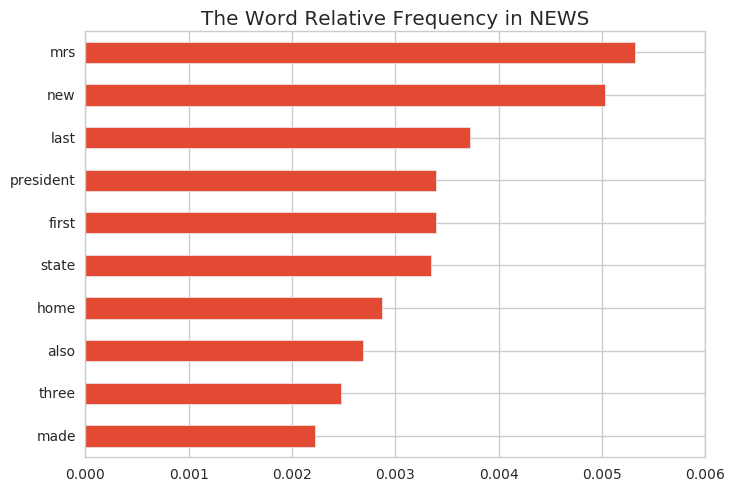

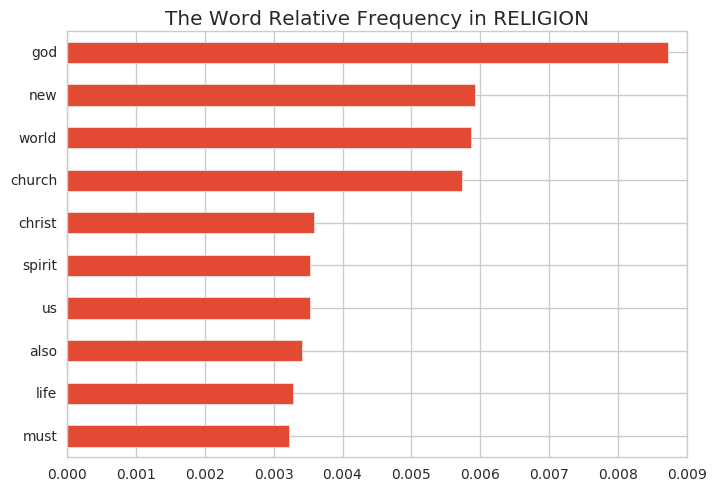

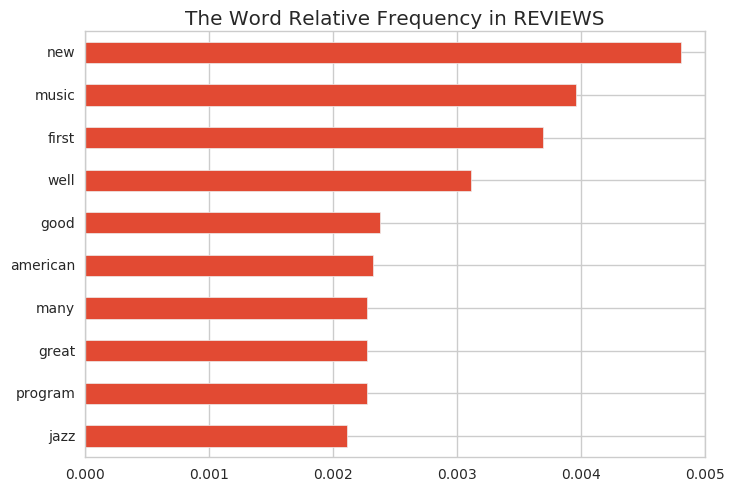

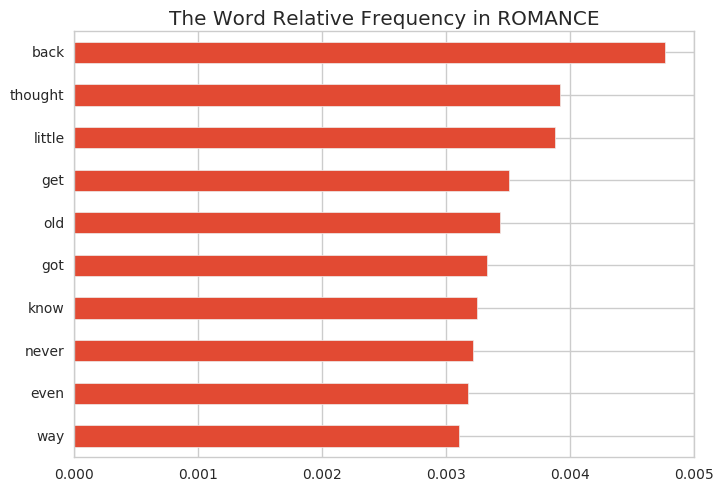

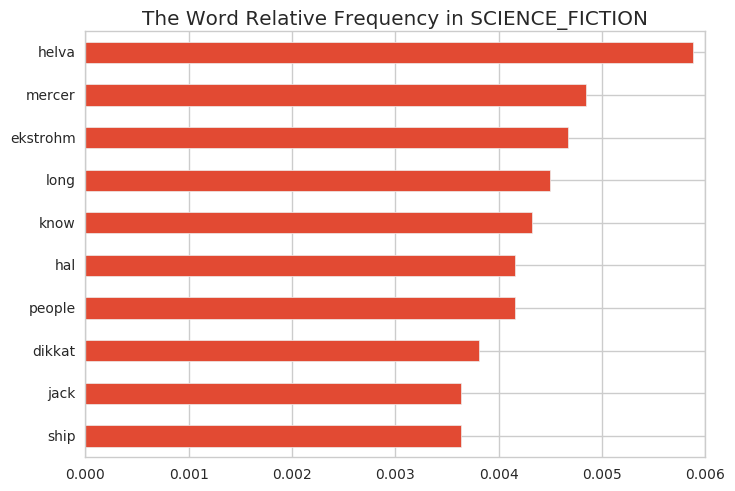

In [40]:
# visualize the 10 most common vocabulary
for c_genre in brown.categories():
    # find the list of index in a certain category
    c_list = list(df_grouped.get_group(c_genre).index)
    #
    # subset according to genre
    df_cat = df.iloc[c_list]
    #
    # calculate the word frequency of each vocabulary 
    voc_word_cat = df_cat.sum()
    #
    # calculate the relative frequency
    rf_voc = voc_word_cat/voc_word_cat.sum()
    # plot the word frequency plot for each genre
    # plot the top 10 frequency
    ax = rf_voc.sort_values()[-10:].plot(kind='barh')
    plt.title('The Word Relative Frequency in ' + c_genre.upper())
    plt.show()

#### 3.2.2 TF-IDF by Genre

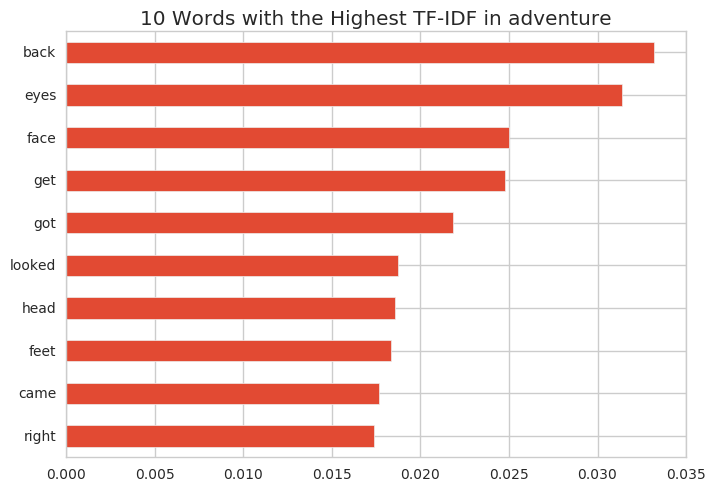

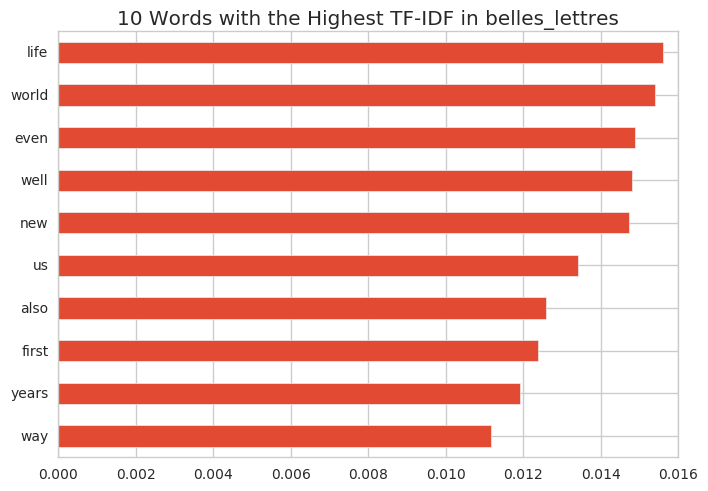

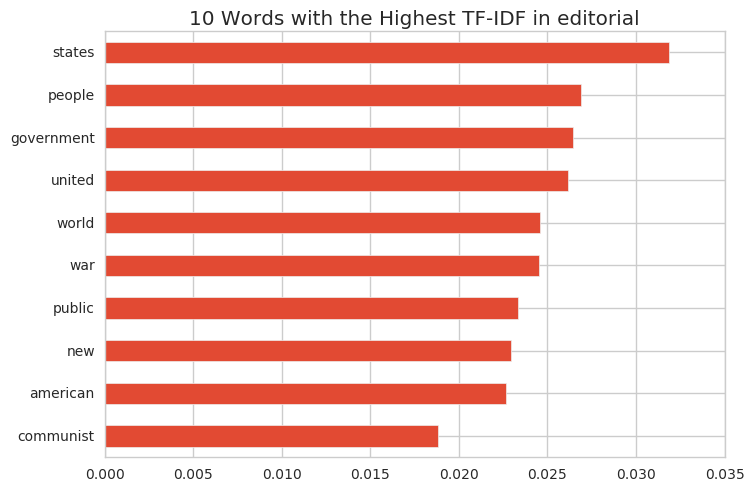

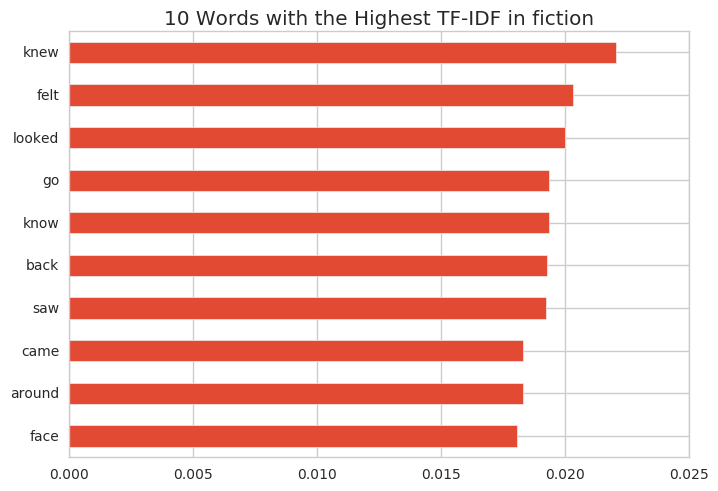

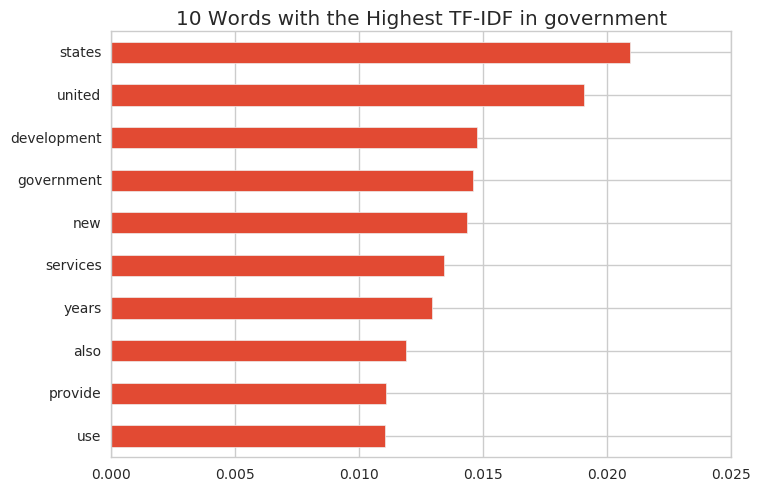

...

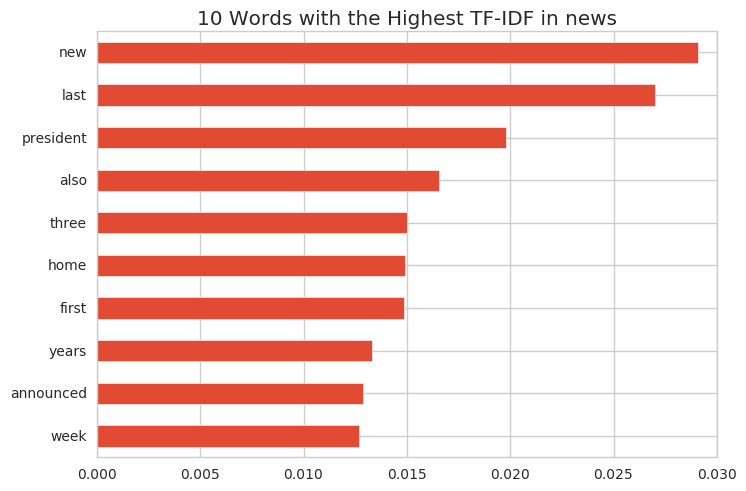

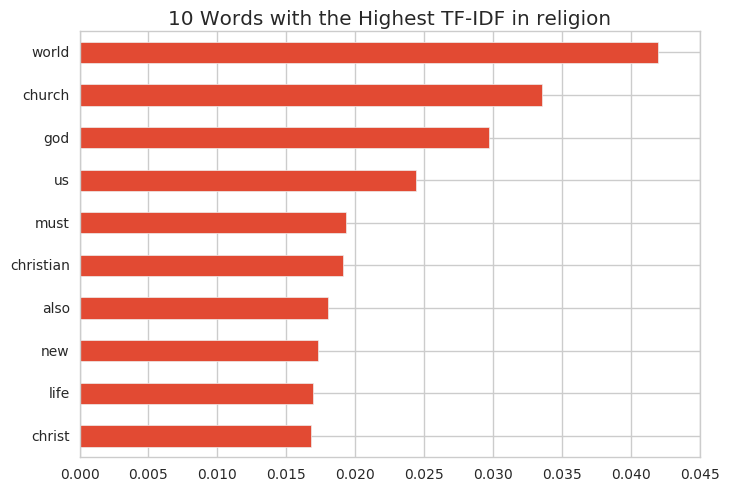

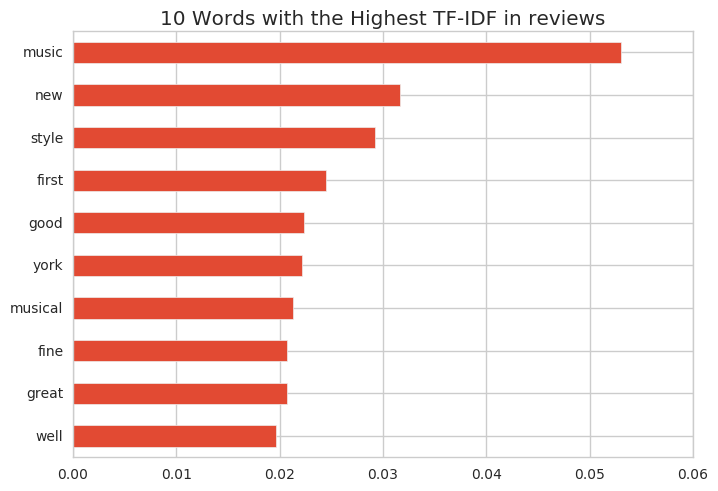

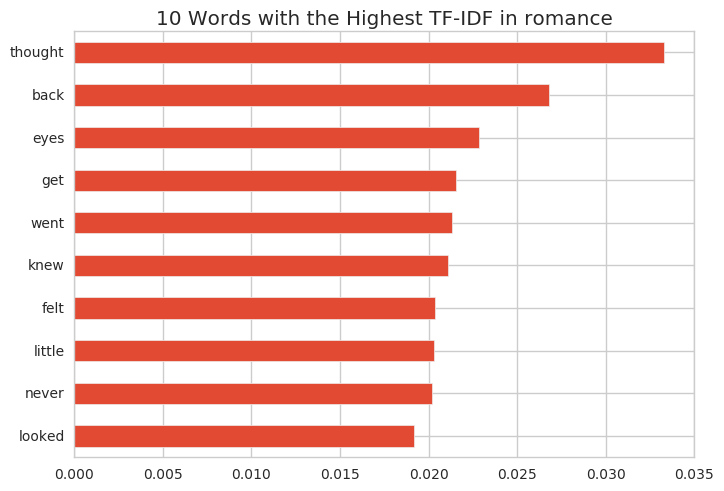

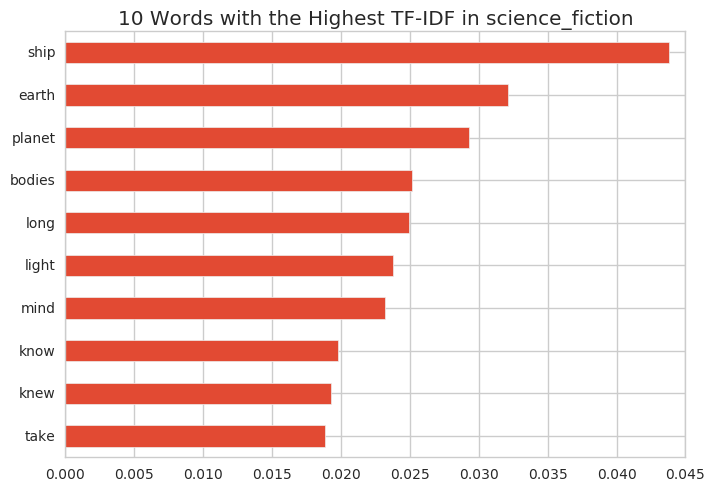

In [ ]:
# visualize the 10 words with max tfidf
for c_genre in brown.categories():
    # find the list of index in a certain category
    c_list = list(df_grouped.get_group(c_genre).index)
    #
    # subset according to genre
    df_tfidf_cat = df_tfidf.iloc[c_list]
    #
    # calculate the median value of tf-idf for each vocabulary 
    tfidf_median_cat = df_tfidf_cat.median()
    #
    # visualize the 10 words with max tfidf
    ax = tfidf_median_cat.sort_values()[-10:].plot(kind='barh')
    plt.title('10 Words with the Highest TF-IDF in ' + c_genre)
    plt.show()

## 4. Word Cloud

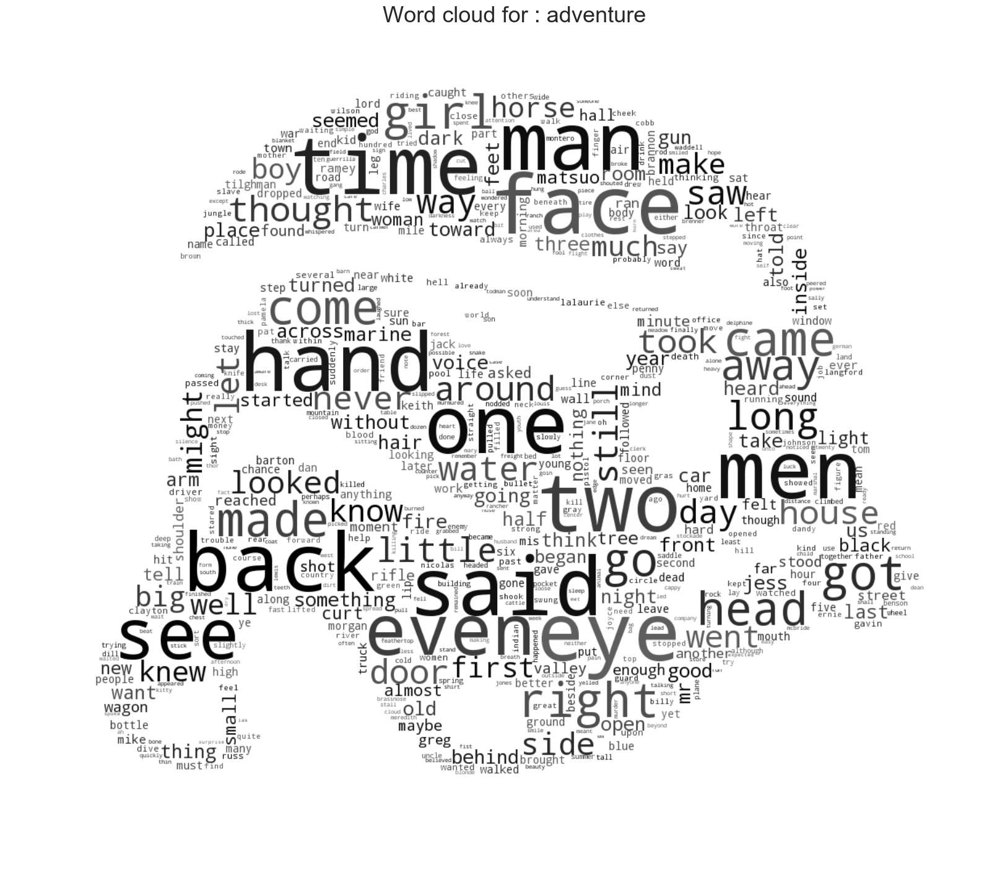

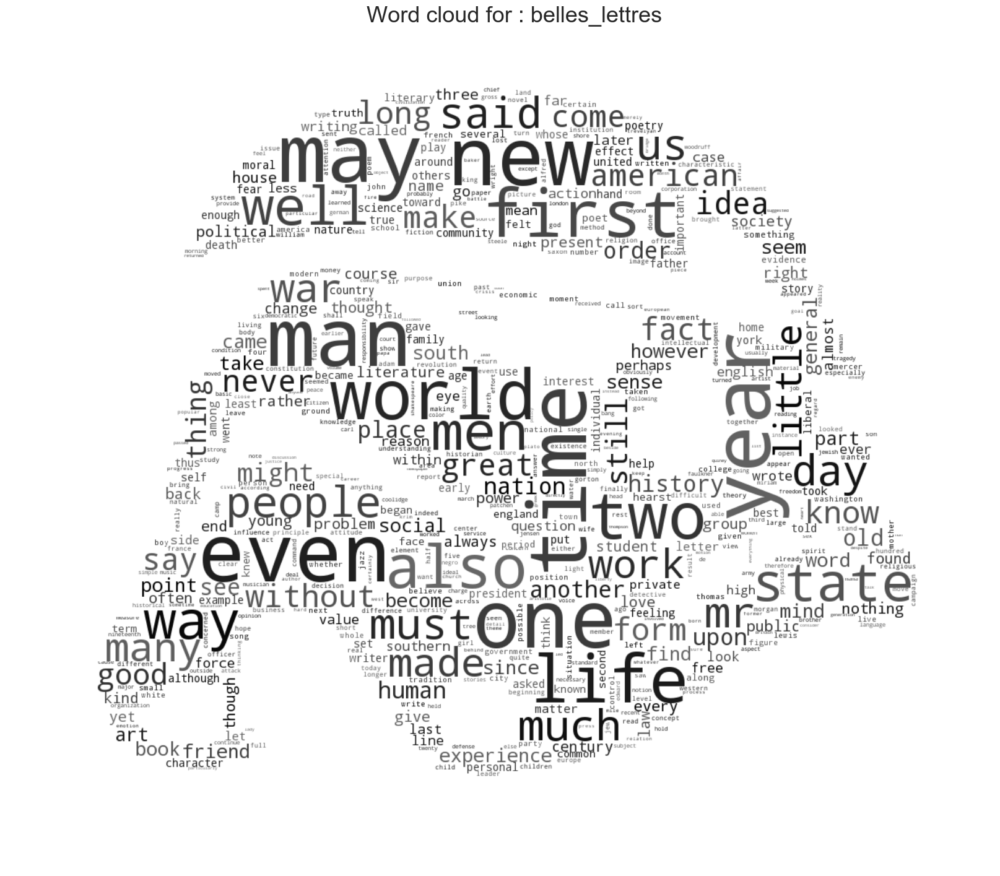

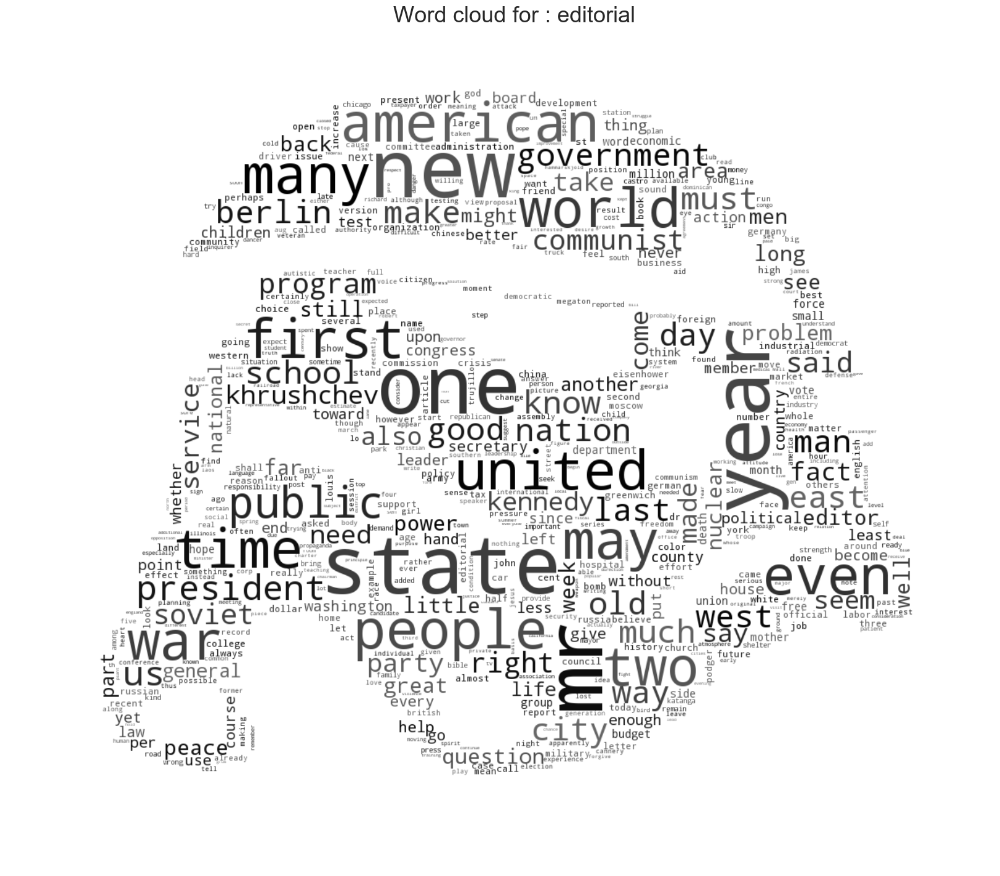

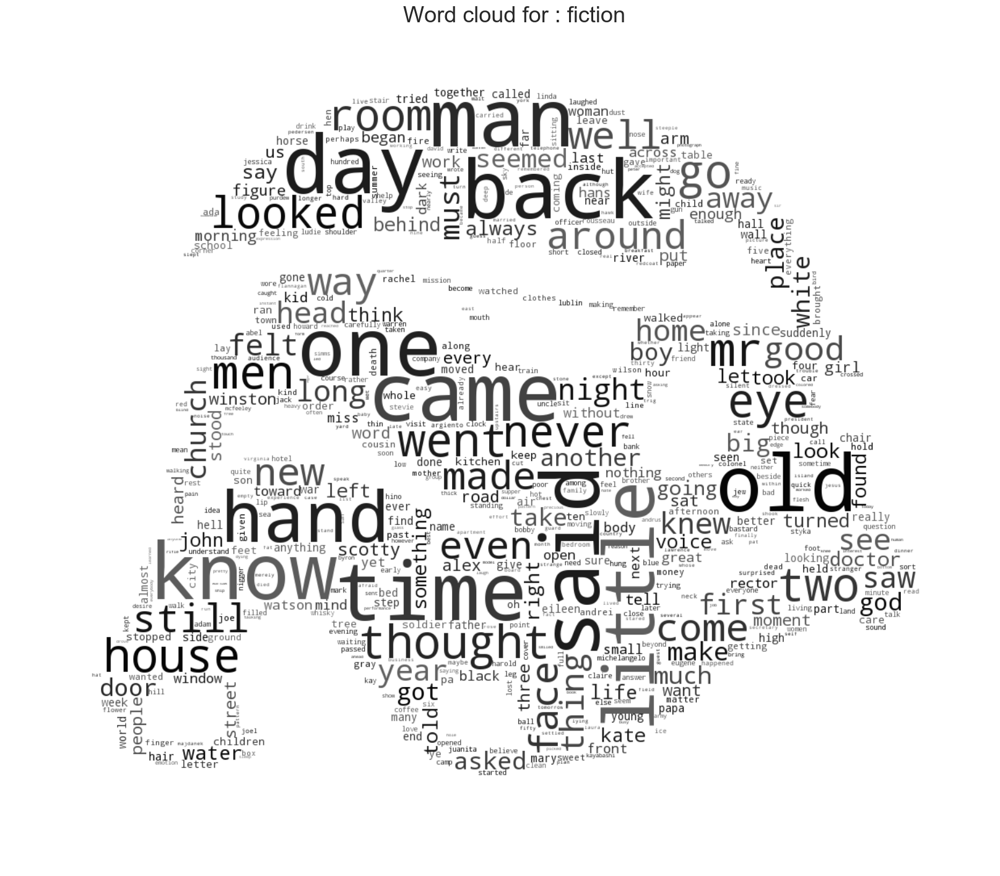

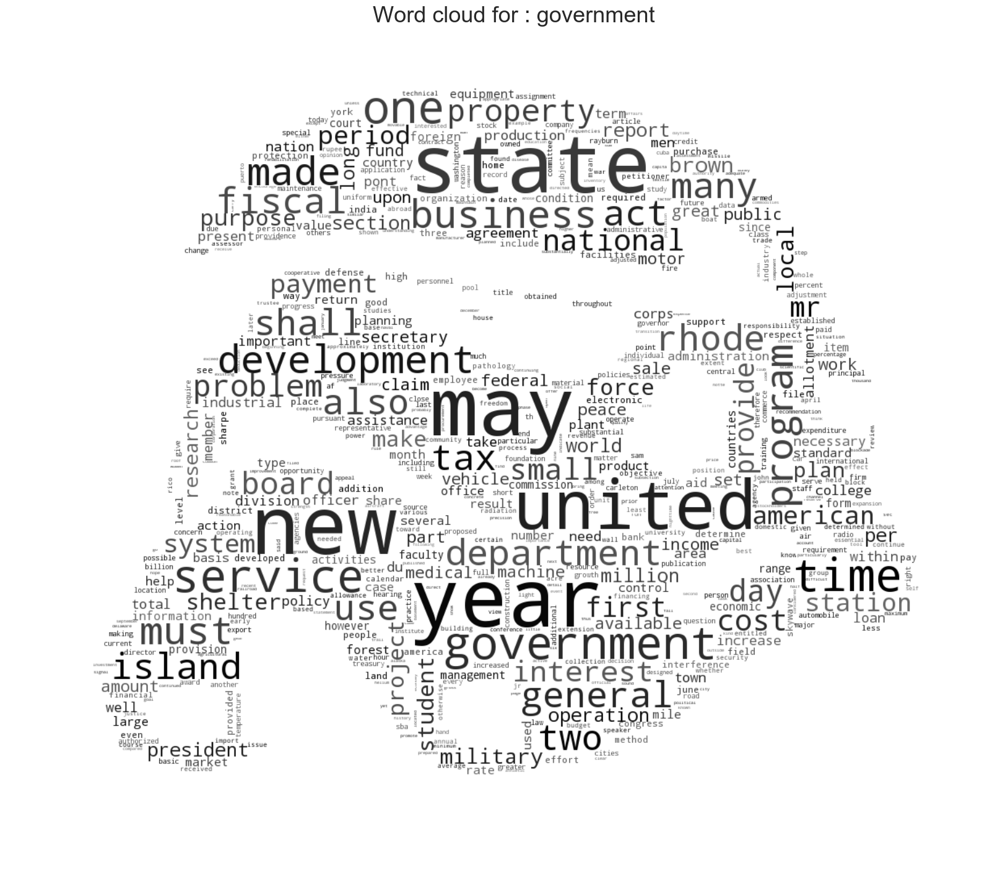

...

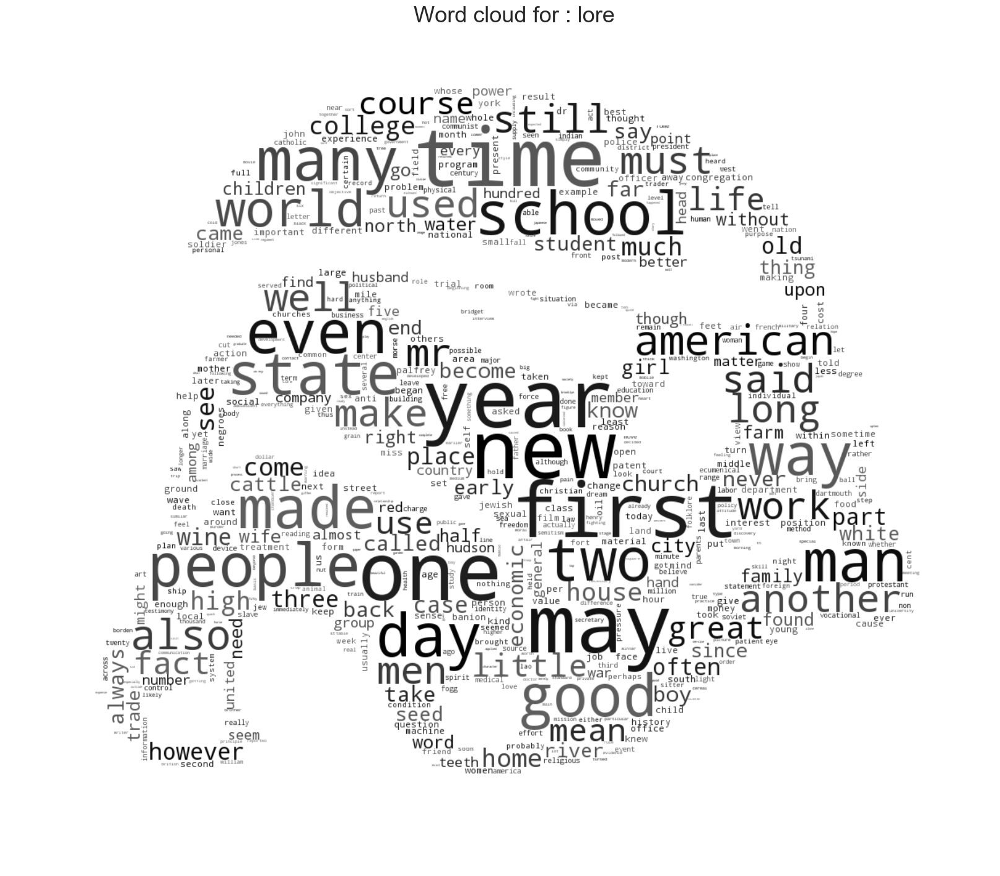

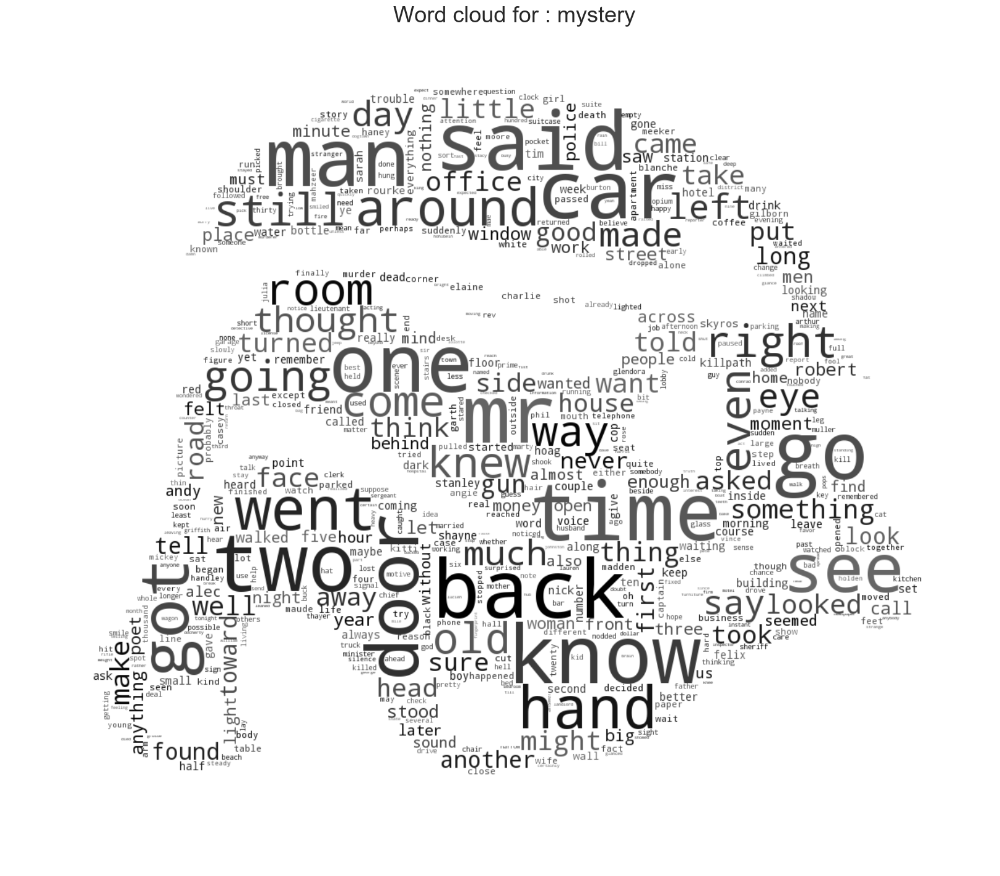

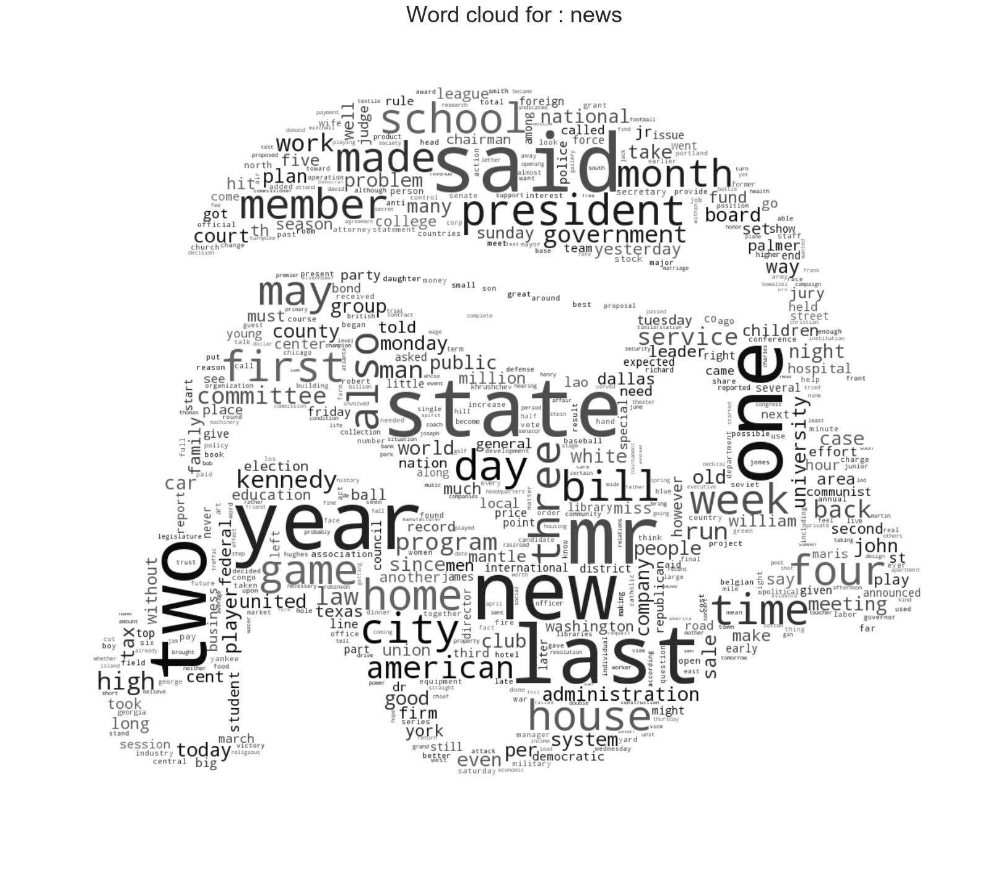

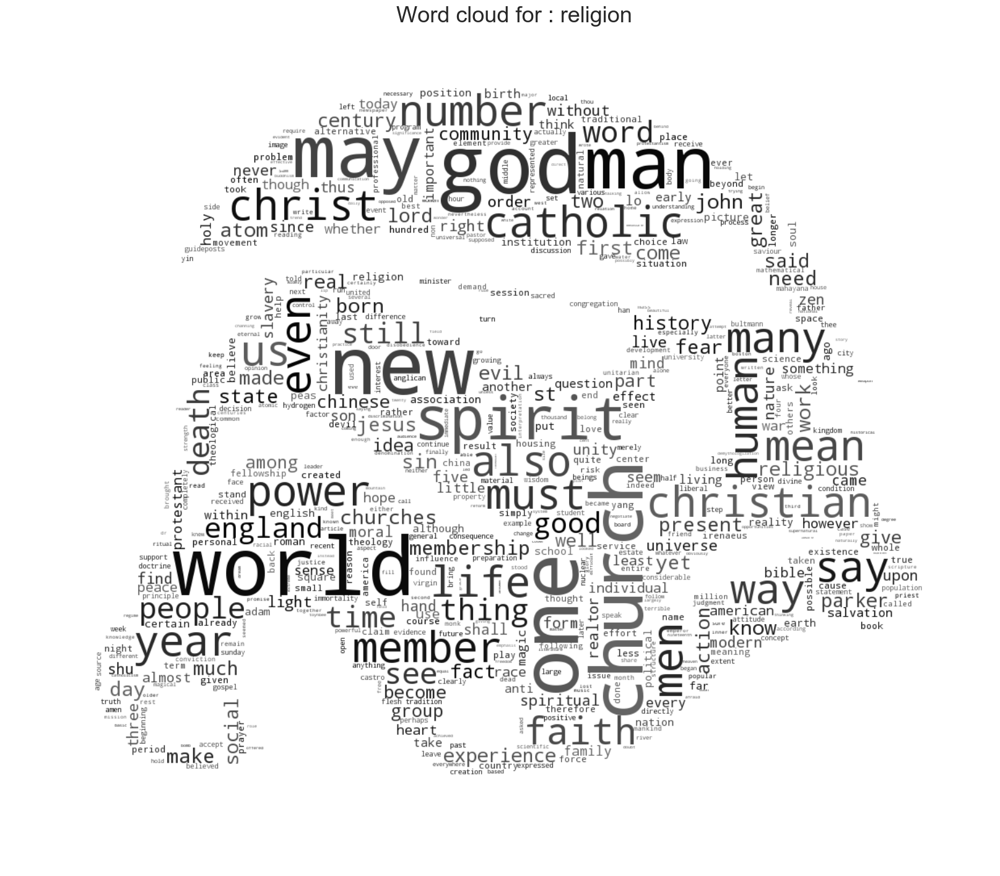

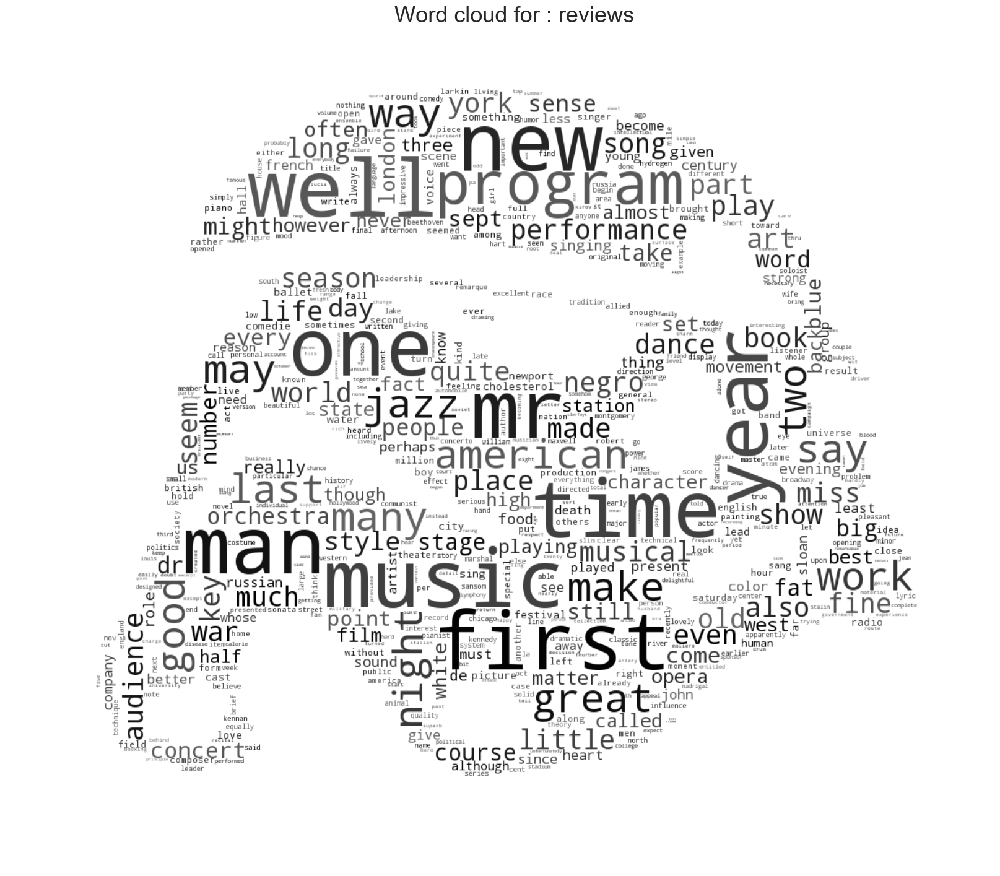

In [ ]:
from os import path
from wordcloud import WordCloud
import numpy as np
from PIL import Image
from os import path
import matplotlib.pyplot as plt
import random

for categ in brown.categories():
    m_files=[]
    
# Loop over each file; create an index i that goes from 0 to the length of the file list 
    for fileid in brown.fileids(categories = categ):
   
    # Call our function for each one, and add the result to the list of clean list
         m_files.append(clean_brown(brown.words(fileid)))
        


    text = ''.join(m_files)

    wordcloud = WordCloud().generate(text)


    def grey_color_func(word, font_size, position, orientation, random_state=None, **kwargs):

        return "hsl(0, 0%%, %d%%)" % random.randint(0, 40)

    mask = np.array(Image.open('C:\\Users\\zeen\\Desktop\\lason\\hope.png'))

    wordcloud = WordCloud(width=1200, height=600, max_words=600, max_font_size=100, background_color='white',\
                      mask=mask).generate(text)

    plt.figure(figsize=(20, 20))

    plt.imshow(wordcloud.recolor(color_func=grey_color_func, random_state=3))
   
    plt.axis("off")
    plt.title('Word cloud for : '+categ,fontsize=26)

    plt.show()

## Reference

Natural Language Toolkit. Accessing Text Corpora and Lexical Resources. 
    http://www.nltk.org/book/ch02.html  (Accessed 02/07/2017)

Kaggle. Part 1: For Beginners - Bag of Words.
    https://www.kaggle.com/c/word2vec-nlp-tutorial/details/part-1-for-beginners-bag-of-words  (Accessed 02/07/2017)
